## 5420 Anomaly Detection, Fall 2020

#### Assignment 9: Supervised Machine Learning Techniques I

Submitted by:
Harsh Dhanuka, hd2457

## Objectives

It is important in any data science project to define the objective as specific as possible. Below let's write it from general to specific. This will direct our analysis.

* Build a model for Loan Default Prediction
* Build a model for Loan Default Prediction using the H2O package, GBM Gradient Boosting function
* Build a model for Loan Default Prediction using the H2O package, GBM Gradient Boosting function, using H2O Grid Search to identify optimum parameters
* Build a model for Loan Default Prediction using the H2O package, Deep Learning function

### Please click Section 4 to directly go to the Machine Learning Models


## Table of Contents

Section 1: Initial Steps

* [Section 1: Initial Steps](#Section_1)
    * [Section 1.1: Load Data](#Section_11)
    * [Section 1.2: Basic Summary Check](#Section_12)
    * [Section 1.3: Basic EDA and considerations](#Section_13)
    
    
Section 2: Data Cleaning and Preparation, Feature Engineering

* [Section 2: Data Cleaning and Preparation, Feature Engineering](#Section_2)
    * [Section 2.1: Convert the DateTime column AP005 to the relevant formats of Year, Month, Day](#Section_21)
    * [Section 2.2: Convert the misrepresented numerical categorical variables back to relevant category/object format](#Section_22)    
    * [Section 2.3: Drop all blank value and id columns](#Section_23)
    * [Section 2.4: Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation](#Section_24)
    * [Section 2.5: Fill NA's using Iterative Imputer](#Section_25)
    * [Section 2.6: Convert the loan amount column CR009 to a category variable and bin appropriately](#Section_26)    


Section 3: EDA of all variables and binning

* [Section 3: EDA and binning](#Section_3)
    * [Section 3.1: Check the Correlation using correlation plot](#Section_31)
    * [Section 3.2: Create categorical variables using qcut, and assign function to bin all continuous variables](#Section_32)
    * [Section 3.3: Distributions of the numerical data, and the % Y by X which is the mean column for all the Nategorical columns here](#Section_33)
    * [Section 3.4: Distributions of the categorical data, and the % Y by X which is the mean column for all the Categorical columns here](#Section_34)
    * [Section 3.5: EDA - Showing the distribution of X](#Section_35)
    * [Section 3.6: EDA - Showing the Distribution of Y by another Categorical Variable X](#Section_36)
    * [Section 3.7: EDA - Showing interaction of 2 or 3 variables](#Section_37)


Section 4: Models

* [Section 4: Models](#Section_4)
    * [Section 4.1: GBM Model using H2O](#Section_41)
        * [Section 4.1.1: Grid Search for optimum GBM Model parameters](#Section_411)
        * [Section 4.1.2: GBM Model](#Section_412)
    * [Section 4.2: Deep Learning  Model using H2O](#Section_42)

### GBM Model:

GBM is a type of Boosting Model.
Gradient boosting is a machine learning technique for regression and classification problems, which produces a prediction model in the form of an ensemble of weak prediction models, typically decision trees. It builds the model in a stage-wise fashion like other boosting methods do, and it generalizes them by allowing optimization of an arbitrary differentiable loss function.

### Deep Learning Model:

Deep learning (also known as deep structured learning) is part of a broader family of machine learning methods based on artificial neural networks with representation learning. Learning can be supervised, semi-supervised or unsupervised.

Deep learning architectures such as deep neural networks, deep belief networks, recurrent neural networks and convolutional neural networks have been applied to fields including computer vision, machine vision, speech recognition, natural language processing, audio recognition, social network filtering, machine translation, bioinformatics, drug design, medical image analysis, material inspection and board game programs, where they have produced results comparable to and in some cases surpassing human expert performance.


### H2O package
H2O is a fully open source, distributed in-memory machine learning platform with linear scalability. H2O supports the most widely used statistical & machine learning algorithms including gradient boosted machines, generalized linear models, deep learning and more. H2O also has an industry leading AutoML functionality that automatically runs through all the algorithms and their hyperparameters to produce a leaderboard of the best models. The H2O platform is used by over 18,000 organizations globally and is extremely popular in both the R & Python communities.

# 1. Initial Steps <a class="anchor" id="Section_1"></a>

In [1]:
# Import all packages
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import scipy
import time
import seaborn as sns
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, confusion_matrix
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve

import plotly
import plotly.express as px

from imblearn.datasets import make_imbalance
import pylab as pl
from collections import Counter

## 1.1. Load Data  <a class="anchor" id="Section_11"></a>

In [2]:
# Read the data
df = pd.read_csv('/Users/harshdhanuka/Desktop/Columbia Class Matter/SEM 3/5420 Anomaly Detection/Assignment 2 EDA/XYZloan_default_selected_vars.csv')
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP005,AP006,...,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005,MB007
0,0,1,1,1,31,2,1,12,2017/7/6 10:21,ios,...,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7
1,1,2,2,0,27,1,1,12,2017/4/6 12:51,h5,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,NaN,WEB


## 1.2. Basic Summary Check <a class="anchor" id="Section_12"></a>

In [3]:
print("Number of rows and columns in the dataset:")
df.shape

Number of rows and columns in the dataset:


(80000, 89)

In [4]:
# Check basic statistics
print("Basic statistics of the columns are as follows:")
df.describe()

Basic statistics of the columns are as follows:


,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP007,AP008,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,...,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.00000,79619.000000,79619.000000,77207.000000
mean,39999.500000,40000.500000,40000.500000,0.193600,31.706913,1.321813,2.014925,11.235413,3.30130,3.117200,...,6.911956,14.271694,11.773358,909.089313,810.786219,1732.693314,1539.33443,2513.226491,2229.606137,5.976272
std,23094.155105,23094.155105,23094.155105,0.395121,7.075070,0.467174,1.196806,2.212313,1.33655,1.306335,...,28.007499,38.235012,33.270641,1379.553332,1245.044602,2441.503517,2172.71384,3404.975112,3005.615048,3.641814
min,0.000000,1.000000,1.000000,0.000000,20.000000,1.000000,1.000000,3.000000,1.00000,1.000000,...,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.00000,-99.000000,-99.000000,0.000000
25%,19999.750000,20000.750000,20000.750000,0.000000,27.000000,1.000000,1.000000,12.000000,2.00000,2.000000,...,2.000000,5.000000,4.000000,84.000000,34.000000,309.000000,226.00000,539.000000,414.000000,3.000000
50%,39999.500000,40000.500000,40000.500000,0.000000,30.000000,1.000000,1.000000,12.000000,3.00000,3.000000,...,7.000000,12.000000,10.000000,475.000000,397.000000,1023.000000,870.00000,1553.000000,1324.000000,5.000000
75%,59999.250000,60000.250000,60000.250000,0.000000,35.000000,2.000000,3.000000,12.000000,5.00000,4.000000,...,14.000000,23.000000,20.000000,1209.000000,1080.000000,2287.000000,2030.00000,3296.000000,2936.000000,8.000000
max,79999.000000,80000.000000,80000.000000,1.000000,56.000000,2.000000,6.000000,12.000000,5.00000,5.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.00000,125352.000000,87312.000000,47.000000


## 1.3. Basic EDA and considerations <a class="anchor" id="Section_13"></a>

### a. Basic EDA of one variable `AP006`

h5         44246
ios        17159
android    17140
api         1455
Name: AP006, dtype: int64

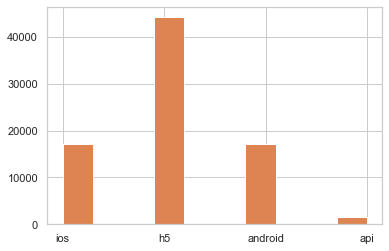

In [5]:
df['AP006'].hist()
df.AP006.hist()
df['AP006'].value_counts()

### b. EDA of the target variable `loan_default`

The number of 0's and 1's are:
0    64512
1    15488
Name: loan_default, dtype: int64


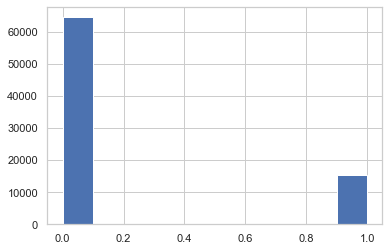

In [6]:
# Check the target variable column
print("The number of 0's and 1's are:")
print(df['loan_default'].value_counts())

df['loan_default'].hist()

### c. Check the column data types, and NA's

In [7]:
#df.info()

### d. Feature considerations from eyeballing the data types

1. The first 3 variables are ID columns, cannot be used for predictions.
`Unnamed: 0`, `Unnamed: 0.1` and `id`. 

They need to be dropped.

2. `AP005` is a Date-Time column, which cannot be used for any predictions in the model. Date-Time columns act as an ID column and all have unique values, which misrepresents the variable while making predictions. The reason is that this field almost becomes a unique identifier for each record. It is as if you employ the ‘id’ field in your decision trees. 

I will derive year, month, day, weekday, etc. from this field. In some models, we may use ‘year’ as a variable just to explain any special volatility in the past. But we will never use the raw DateTime field as a predictor.
 
3. The following columns have 0 as their value in all entries, and hence, they need to be removed from any model predictions. 

`TD025`, `TD026`, `TD027`, `TD028`, `CR012`.

4. The following columns have the same value in all entries, and hence, they need to be removed from any model predictions.

`TD029`, `TD044`, `TD048`, `TD051`, `TD054`, `TD055`, `TD061`, `TD062`.

5. Check for categorical fields from the data variable descriptions. Convert the relevant numeric fields to their respective categorical fields:

`AP002`Gender,
`AP003`Education Code,
`AP004`Loan Term,
`AP006`OS Type,
`AP007`Application City Level,
`AP008`Flag if City not Application City,
`AP009` Binary format,
`MB007` Mobile Brands/type

# 2. Data Cleaning and Preparation, Feature Engineering <a class="anchor" id="Section_2"></a>

## 2.1. Convert the DateTime column `AP005` to the relevant formats of Year, Month, Day  <a class="anchor" id="Section_21"></a>

In [8]:
df['AP005'] =  pd.to_datetime(df['AP005'])

In [9]:
# Create 4 new columns
df['Loan_app_day_name'] = df['AP005'].dt.day_name()
df['Loan_app_month'] = df['AP005'].dt.month_name()
df['Loan_app_time'] = df['AP005'].dt.time
df['Loan_app_day'] = df['AP005'].dt.day

In [10]:
# Drop old column
df = df.drop(columns = ['AP005']) 
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,0,1,1,1,31,2,1,12,ios,3,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,1,2,2,0,27,1,1,12,h5,5,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.2. Convert the misrepresented numerical categorical variables back to relevant category/object format <a class="anchor" id="Section_22"></a>

In [11]:
df["AP002"] = df["AP002"].astype('object')

df["AP003"] = df["AP003"].astype('object')
df["AP004"] = df["AP004"].astype('object')
df["AP006"] = df["AP006"].astype('object')
df["AP007"] = df["AP007"].astype('object')
df["AP008"] = df["AP008"].astype('object')
df["AP009"] = df["AP009"].astype('object')

df["CR015"] = df["CR015"].astype('object')

df["MB007"] = df["MB007"].astype('object')

df['Loan_app_day_name'] = df['Loan_app_day_name'].astype('object')
df['Loan_app_month'] = df['Loan_app_month'].astype('object')
df['Loan_app_time'] = df['Loan_app_time'].astype('object')
df['Loan_app_day'] = df['Loan_app_day'].astype('object')

## 2.3. Drop all blank value/id columns  <a class="anchor" id="Section_23"></a>

In [12]:
df = df.drop(columns = ['Unnamed: 0', 'Unnamed: 0.1', 'id', 'TD025', 'TD026', 'TD027', 'TD028', 'CR012','TD029', 'TD044', 'TD048', 'TD051', 'TD054', 'TD055', 'TD061', 'TD062']) 
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.4. Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation  <a class="anchor" id="Section_24"></a>

As per all the variable description, all the following columns are either counts, lengths, or days. Hence, the negative values such as -999, -99, -98, -1, etc are all mis-read NA's and need to be converted back to 'nan' format.

In [13]:
features_nan = ['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005']

In [14]:
# Define a function to convert negatives to nan
def convert_to_nan(var):
    df[var][df[var] < 0] = np.nan

In [15]:
for i in features_nan:
    convert_to_nan(i)

In [16]:
# Verify that the negatives are gone
print("The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.")
df[features_nan].describe()

The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.


,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,80000.000000,80000.000000,80000.000000,...,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,77207.000000
mean,31.706913,1.986962,0.706213,3.593037,1.345700,5.40600,2.020812,6.804737,2.603662,0.718775,...,11.501677,19.180352,16.573750,952.775121,850.212037,1812.070212,1610.332071,2626.427993,2330.516878,5.976272
std,7.075070,1.807445,0.918347,2.799570,1.413362,4.02311,1.973988,5.128183,2.505840,0.882962,...,17.641851,30.743372,24.496918,1392.729146,1256.936168,2463.242747,2191.780118,3433.330482,3029.857757,3.641814
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1.000000,0.000000,2.000000,0.000000,3.00000,1.000000,3.000000,1.000000,0.000000,...,3.000000,6.000000,5.000000,123.000000,76.000000,382.000000,294.000000,649.000000,512.000000,3.000000
50%,30.000000,2.000000,0.000000,3.000000,1.000000,4.00000,2.000000,6.000000,2.000000,0.000000,...,7.000000,13.000000,11.000000,518.000000,437.000000,1098.000000,940.000000,1658.000000,1423.000000,5.000000
75%,35.000000,3.000000,1.000000,5.000000,2.000000,7.00000,3.000000,9.000000,4.000000,1.000000,...,14.000000,24.000000,21.000000,1258.000000,1123.000000,2369.000000,2107.000000,3417.000000,3037.000000,8.000000
max,56.000000,20.000000,11.000000,24.000000,21.000000,46.00000,35.000000,52.000000,43.000000,7.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.000000,125352.000000,87312.000000,47.000000


## 2.5. Fill the NA's using Iterative Imputer <a class="anchor" id="Section_25"></a>

Multivariate imputer that estimates each feature from all the others. A strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion.

#### Instead of using the traditional simple mean, median or mode method of imputation, I will be using the smart method of Iterative Imputation from sklearn package.

The documentation is here: https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html

In [17]:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer

#### Make a subset of the original df with only the numeric/float64  variables which have the NA's

In [18]:
df_2 = df[features_nan]

In [19]:
# Verify

df_2.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8.0,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0
1,27,2,0,3,1,3,1,3,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,33,2,1,4,1,5,1,9,1,2,...,0.0,3.0,2.0,33.0,0.0,33.0,0.0,143.0,110.0,8.0


#### 'MEDIAN' imputation through iterative imputer

In [20]:
imp = IterativeImputer(missing_values=np.nan, sample_posterior=False, 
                                 max_iter=10, tol=0.001, 
                                 n_nearest_features=None, initial_strategy='median')
imp.fit(df_2)

IterativeImputer(initial_strategy='median')

In [21]:
imputed_data_median = pd.DataFrame(data=imp.transform(df_2), 
                             columns=['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'],
                             dtype='int')

In [22]:
imputed_data_median.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8,13,13,0,0,1449,1449,2249,2249,7
1,27,2,0,3,1,3,1,3,2,0,...,7,13,10,531,465,1086,939,1651,1425,5
2,33,2,1,4,1,5,1,9,1,2,...,0,3,2,33,0,33,0,143,110,8


## 2.6. Convert the loan amount column `CR009` to a category variable and bin appropriately <a class="anchor" id="Section_26"></a>

In [23]:
df['CR009'] = pd.cut(x=df['CR009'], bins=[-1, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 1000000, 1500000])
df = df.astype({'CR009':'object'})

In [24]:
df.CR009.value_counts()

(-1, 100000]          74142
(100000, 200000]       4125
(200000, 300000]        975
(300000, 400000]        353
(400000, 500000]        166
(500000, 600000]         95
(600000, 700000]         48
(700000, 800000]         32
(1000000, 1500000]       31
(800000, 900000]         19
(900000, 1000000]        14
Name: CR009, dtype: int64

# 3. EDA of variables and binning  <a class="anchor" id="Section_3"></a>

## 3.1. Check the Correlation using correlation plot <a class="anchor" id="Section_31"></a>

I will check this for the variables which are not direct counts or lengths or days.
#### The variables I use are the ones which are marked at `Credit Center` data.

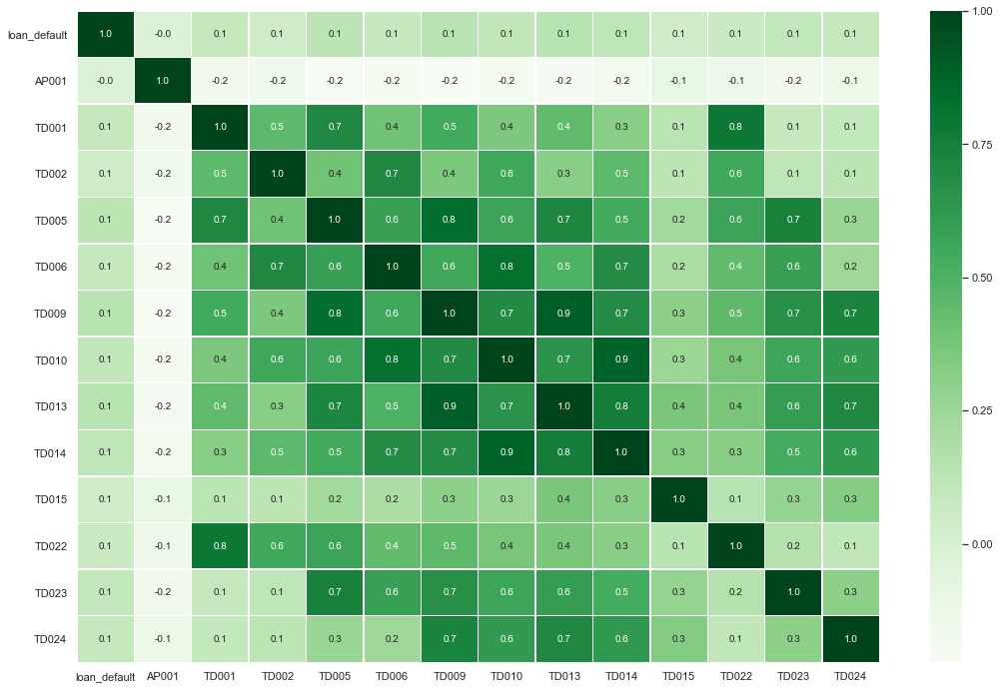

In [25]:
corr = df[['loan_default', 'AP001', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010', 'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024']].corr()
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [26]:
# Remove 1 feeature from a pair which has over 0.7 ratio
# However, H2O deals with this problem smartly, I will not remove the variables

corr_var_drop1 = ['TD005', 'TD022', 'TD006', 'TD009', 'TD013', 'TD023', 'TD010', 'TD014']

#### Check the correlations for the counts, lengths, and days columns
I will be using the other variables as they are all `Call detail` data. 

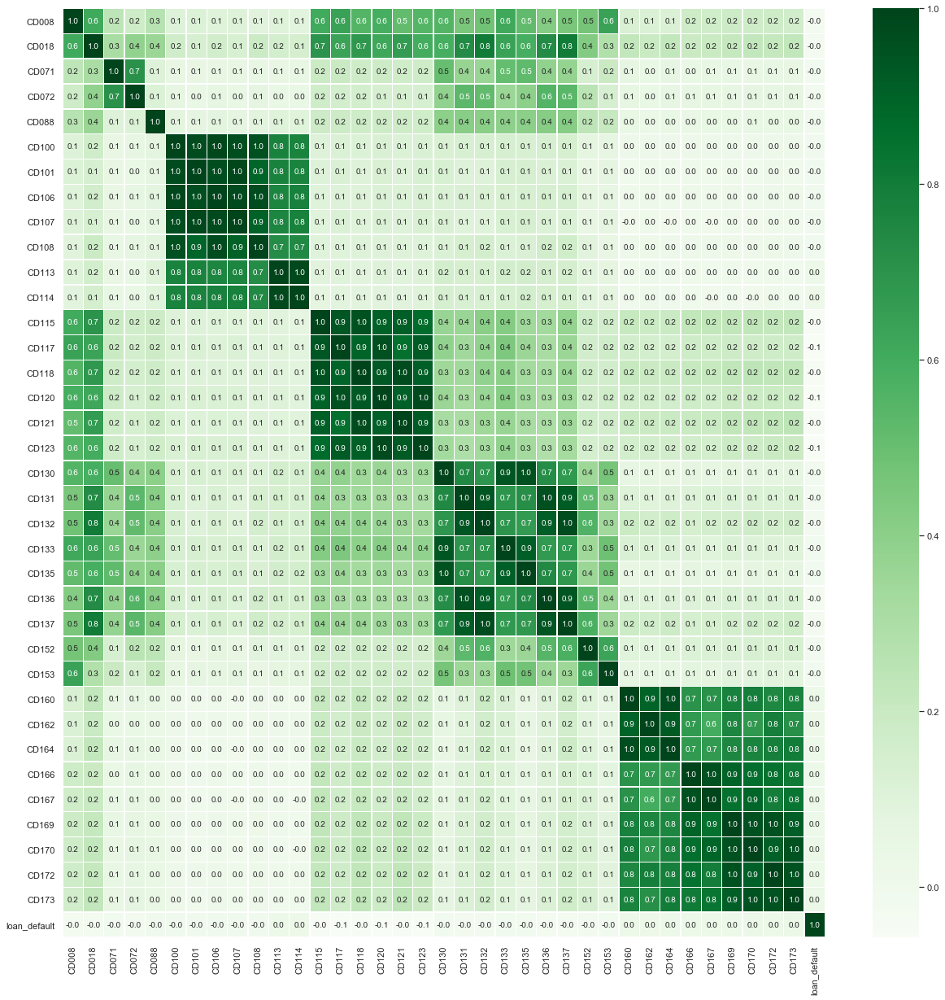

In [27]:
filter_col = [col for col in df if col.startswith('CD')]
filter_col.append('loan_default')
corr = df[filter_col].corr()
f,ax = plt.subplots(figsize=(21,21))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [28]:
# Remove 1 feature from a pair which has over 0.7 ratio
# However, H2O deals with this problem smartly, I will not remove the variables

corr_var_drop2 = ['CD173', 'CD172', 'CD170', 'CD169', 'CD167', 'CD166', 'CD164', 'CD162',
                 'CD137', 'CD136', 'CD135', 'CD133', 'CD132', 'CD131', 'CD117', 'CD118',
                 'CD120', 'CD121', 'CD123', 'CD114', 'CD113', 'CD108', 'CD107', 'CD106',
                 'CD101', 'CD072']

## 3.2. Create categorical variables using qcut, and assign function to bin all continuous variables <a class="anchor" id="Section_32"></a>
### These are for the raw data, not the NA imputed one.

* You may need to split a continuous variable into a categorial variable
* Notice how the NoData category is added for "NA".

In [29]:
df_bin = df.copy(deep = True)
df_bin.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,NaN,NaN,NaN,NaN,NaN,WEB,Thursday,April,12:51:00,6


In [30]:
# Write a function and loop through 
def binning(var):
    df_bin[var + '_bin'] = pd.qcut(df_bin[var],15,duplicates='drop').values.add_categories("NoData")
    df_bin[var + '_bin'] = df_bin[var + '_bin'].fillna("NoData").astype(str)
    df_bin[var + '_bin'].value_counts(dropna=False)

In [31]:
features = ['AP001', # 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       # 'AP008', 'AP009',
       'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       #'CR009', 'CR015', 
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'
       # 'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       # 'Loan_app_day'
           ]

In [32]:
for i in features:
    binning(i)

In [33]:
# View the bins of some variables 

print(df_bin['TD001_bin'].value_counts(dropna=False))
print(df_bin['TD022_bin'].value_counts(dropna=False))

(-0.001, 1.0]    33040
(1.0, 2.0]       22199
(2.0, 3.0]       12186
(3.0, 4.0]        6152
(5.0, 20.0]       3510
(4.0, 5.0]        2913
Name: TD001_bin, dtype: int64
(9.999, 15.0]    36564
NoData           19598
(15.0, 20.0]      9462
(25.0, 30.0]      8420
(20.0, 25.0]      5956
Name: TD022_bin, dtype: int64


## 3.3. Distributions of the numerical data, and the `% Y by X` which is the `mean` column for all the numerical columns here <a class="anchor" id="Section_33"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [34]:
def plot_X_and_Y(var):
    
    z = df_bin.groupby(var + '_bin')['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var + '_bin']
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    #plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    #plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()
    
#for i in features:
#    plot_X_and_Y(i)  
    

## 3.4. Distributions of the categorical data, and the `% Y by X` which is the `mean` column for all the Categorical columns here <a class="anchor" id="Section_34"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [35]:
features_2 = ['AP002', 'AP003', 'AP004', 'AP006', 'AP007', 'AP008', 'AP009',
       'CR009','CR015', 'MB007', 'Loan_app_day_name', 'Loan_app_month',
       'Loan_app_day'
           ]

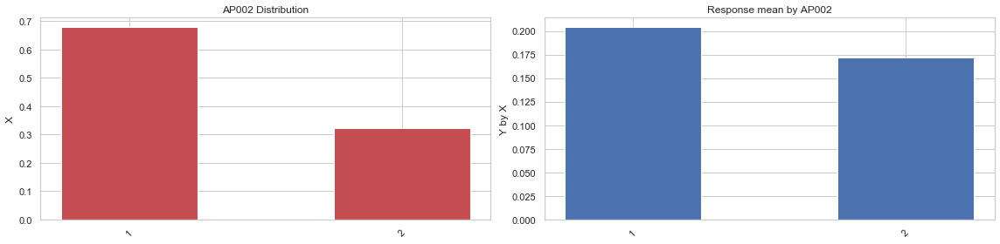

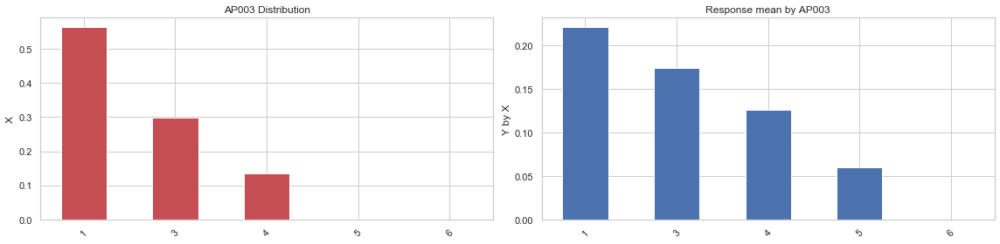

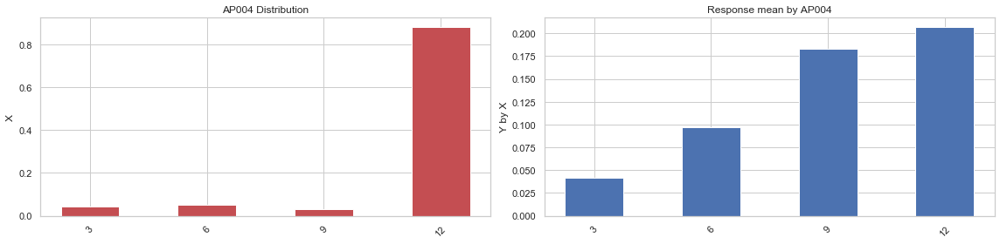

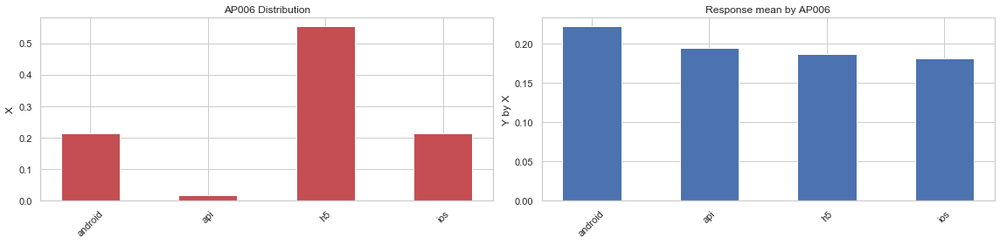

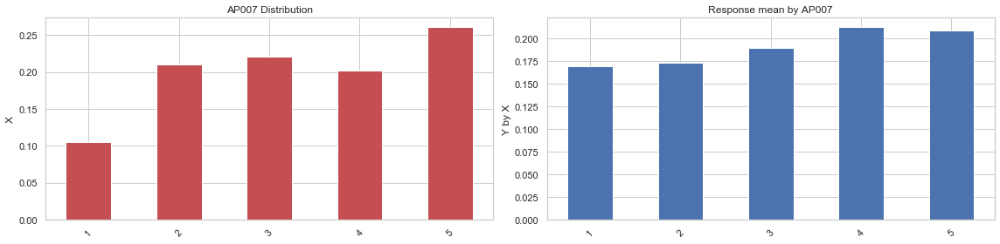

...

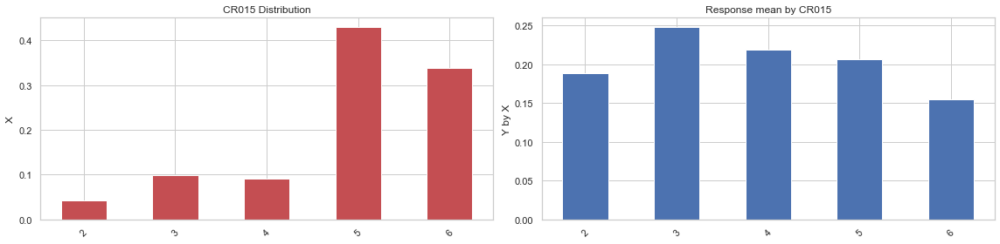

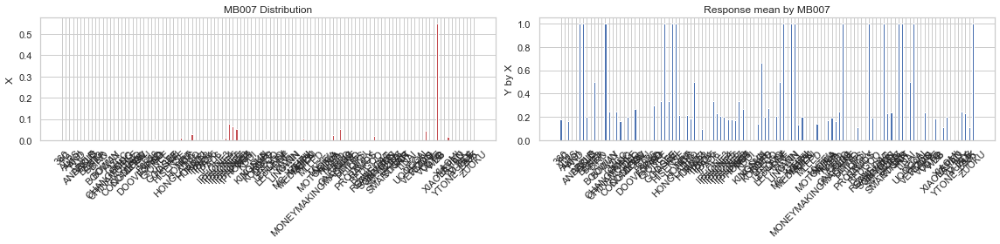

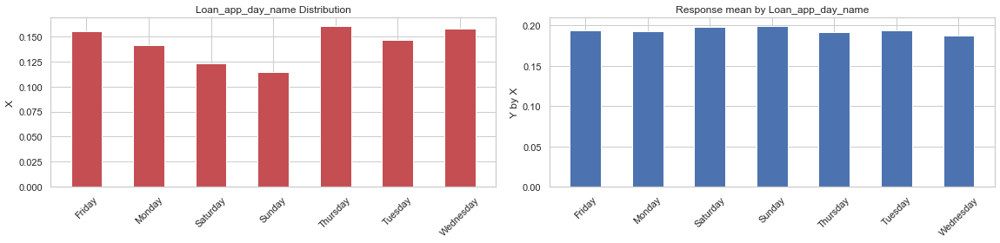

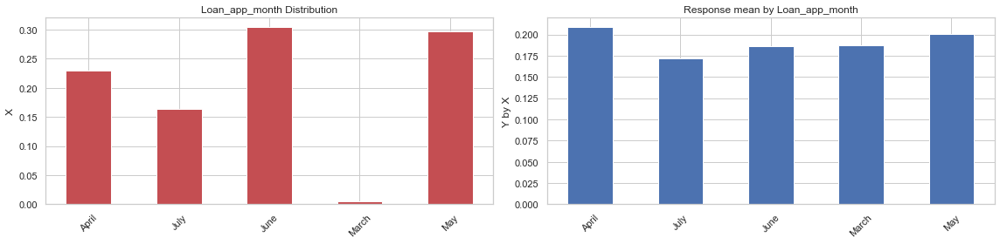

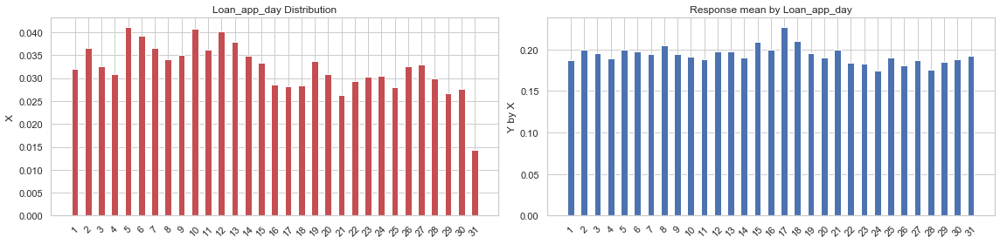

In [36]:
def plot_X_and_Y_cat(var):
    
    z = df_bin.groupby(var)['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var]
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()


for i in features_2:
    plot_X_and_Y_cat(i)  

### Obervations:

From the above graphs, the following variables seem to be not important, as they do not have a pattern or a trend, or a  curve on the '% Y by x' graph: 
1. `Loan_app_day_name`

### Other EDA

## 3.5. Showing the Distribution of X <a class="anchor" id="Section_35"></a>

In [37]:
df_count = df['AP006'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP006 - OS Type','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP006 - OS Type', y = 'Count', color = 'AP006 - OS Type',
             width=600, height=400,
            title = "Distribution of OS type")
fig.show()

  AP006 - OS Type  Count
0              h5  44246
1             ios  17159
2         android  17140
3             api   1455


In [38]:
df_count = df['AP002'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP002 - Gender','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP002 - Gender', y = 'Count', color = 'AP002 - Gender',
             width=600, height=400,
            title = "Distribution of Gender")
fig.show()

   AP002 - Gender  Count
0               1  54255
1               2  25745


In [39]:
df_count = df['AP003'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP003 - Education','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP003 - Education', y = 'Count', color = 'AP003 - Education',
             width=600, height=400,
            title = "Distribution of Education")
fig.show()

   AP003 - Education  Count
0                  1  45079
1                  3  23829
2                  4  10846
3                  5    232
4                  6     14


In [40]:
fig = px.box(df, x="TD001",width=1000, height=500,
            title = "Distribution of TD001 - TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

In [41]:
fig = px.box(df, x="MB005",width=1000, height=500,
            title = "Distribution of MB005")
fig.show()

## 3.6. Showing the Distribution of Y by another Categorical Variable X <a class="anchor" id="Section_36"></a>

In [42]:
fig = px.box(df, x="AP007", y="TD001",width=900, height=400,
             color = "AP002",
            title = "The Distribution of Level Application City by TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

## 3.7. Showing interaction of two or three variables <a class="anchor" id="Section_37"></a>

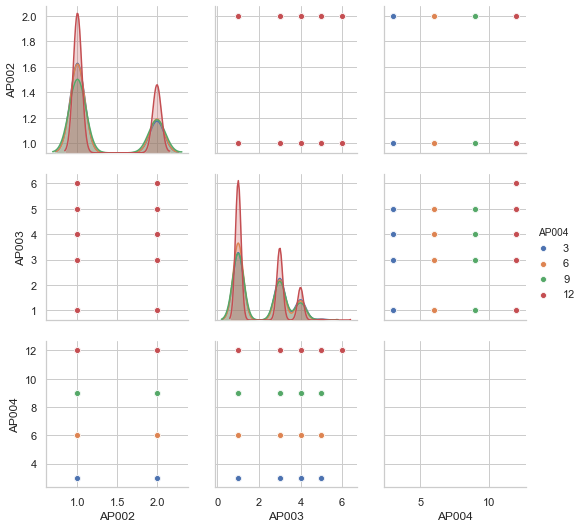

In [43]:
fig = sns.pairplot(df[['AP002', 'AP003', 'AP004']], 
             hue= 'AP004')
fig

# 4. Model <a class="anchor" id="Section_4"></a>

#### Use the non-binned data, fill NA's with Iterative Imputer Median

### Using the median imputed values from the Iterative Imputer

In [44]:
# Over write the NA value columns, with the previously calculated values
df[features_nan] = imputed_data_median

In [45]:
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449,1449,2249,2249,7,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,1086,939,1651,1425,5,WEB,Thursday,April,12:51:00,6


In [46]:
df.isnull().sum().sum()

0

## 4.1. Gradient Boosting (GBM) Model <a class="anchor" id="Section_41"></a>

In [47]:
import h2o
h2o.init()

from h2o.estimators.gbm import H2OGradientBoostingEstimator

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "1.8.0_152-release"; OpenJDK Runtime Environment (build 1.8.0_152-release-1056-b12); OpenJDK 64-Bit Server VM (build 25.152-b12, mixed mode)
  Starting server from /opt/anaconda3/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/fh/qfjpl8t16r516h2bst2m269h0000gn/T/tmpkho__k7i
  JVM stdout: /var/folders/fh/qfjpl8t16r516h2bst2m269h0000gn/T/tmpkho__k7i/h2o_harshdhanuka_started_from_python.out
  JVM stderr: /var/folders/fh/qfjpl8t16r516h2bst2m269h0000gn/T/tmpkho__k7i/h2o_harshdhanuka_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.30.1.3
H2O_cluster_version_age:,1 month and 13 days
H2O_cluster_name:,H2O_from_python_harshdhanuka_d9yp3e
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.778 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"accepting new members, healthy"


### Splitting the data to train-test, and  convert to h2o format

In [48]:
train,test = train_test_split(df,test_size=0.25, random_state = 1234)

# Convert to a  h2o dataframe for computation
df_hex = h2o.H2OFrame(df)
train_hex = h2o.H2OFrame(train)
test_hex = h2o.H2OFrame(test)

# This test_hex will be used all througout the models

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


### Define the target and predictor variables

In [49]:
# Selecting all predictor variables

predictors = ['AP001', 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       'AP008', 'AP009', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR009', 'CR015', 'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005',
       'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       'Loan_app_day']

target = 'loan_default'

In [50]:
len(predictors)

75

In [51]:
len(df.columns.to_list())

76

## 4.1.1. Grid Search for Optimum Gradient Boosting (GBM) Model Hyper Parameters <a class="anchor" id="Section_411"></a>

### Find-tune hyper-parameters in h2o.gbm

The overall strategy is to test more trees and smaller learning rate. The hyperparameters for tuning are the following:

* Learning rate (shrinkage)
* Number of trees
* Interaction depth
* Minimum observation in a node
* Bag fraction (fraction of randomly selected observations)

The learning rate, a value between 0 and 1, corresponds to how quickly the error is corrected from each tree to the next. A small learning rate will result in long computational time, and a large learning rate makes the system unable to settle down. It will be efficient if the learning rate can decay over time. Therefore there is a hyperparameter to decay the learning rate called the "learn_rate_annealing". 

"Annealing", in materials science, describes a heating process that heats up in the beginning then cools down slowly. In gbm a common way to decay the learning rate is call the "step decay". It reduces the learning rate by some factor in every few iterations or epochs. Typical values are to reduce the learning rate by a half every 5 epochs. I will use the following set of hyper parameters for training and finding the best GBM Model.

- 'learn_rate':[0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
- 'max_depth':[2, 3, 4, 5, 6, 7, 8],
- 'ntrees':[200, 300, 350, 400, 450, 500]
- stopping_rounds = 15.

In [52]:
from h2o.grid.grid_search import H2OGridSearch

grid_search_gbm = H2OGradientBoostingEstimator(
    stopping_rounds = 15,
    col_sample_rate = 0.70,
    sample_rate = 0.70,
    seed = 1234) 

hyper_params = {
    'learn_rate':[0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
    'max_depth':[2, 3, 4, 5, 6, 7, 8],
    'ntrees':[200, 300, 350, 400, 450, 500]}

grid = H2OGridSearch(grid_search_gbm, hyper_params,
                         grid_id = 'depth_grid',
                         search_criteria={'strategy': "Cartesian"})
#Train grid search
grid.train(x = predictors, 
           y = target,
           training_frame = train_hex,
           validation_frame = test_hex)

gbm Grid Build progress: |████████████████████████████████████████████████| 100%


In [53]:
grid_sorted = grid.get_grid(sort_by='rmse',decreasing=False)
grid_sorted1 = grid.get_grid(sort_by='r2',decreasing=True)
print(grid_sorted)

       learn_rate max_depth ntrees             model_ids                 rmse
0            0.02         5    350  depth_grid_model_104  0.38037305140848465
1            0.04         3    350   depth_grid_model_94   0.3804275807247296
2            0.02         5    300   depth_grid_model_62   0.3804292299406676
3            0.02         5    400  depth_grid_model_146   0.3804644478371501
4            0.04         3    300   depth_grid_model_52   0.3805002115947978
..  ..        ...       ...    ...                   ...                  ...
247          0.05         7    450  depth_grid_model_203  0.38640529547166746
248          0.04         8    500  depth_grid_model_250   0.3868720707170632
249          0.01         2    200    depth_grid_model_1  0.38698232782526687
250          0.05         7    500  depth_grid_model_245  0.38700238732282516
251          0.05         8    400  depth_grid_model_167  0.38805325010434477

[252 rows x 6 columns]



In [54]:
print(grid_sorted1)

       learn_rate max_depth ntrees             model_ids                    r2
0            0.02         5    350  depth_grid_model_104   0.07476004037230688
1            0.04         3    350   depth_grid_model_94    0.0744947412478818
2            0.02         5    300   depth_grid_model_62   0.07448671679640007
3            0.02         5    400  depth_grid_model_146   0.07431535173217729
4            0.04         3    300   depth_grid_model_52   0.07414131435448501
..  ..        ...       ...    ...                   ...                   ...
247          0.05         7    450  depth_grid_model_203   0.04518102964699955
248          0.04         8    500  depth_grid_model_250   0.04287280531713633
249          0.01         2    200    depth_grid_model_1  0.042327172160864346
250          0.05         7    500  depth_grid_model_245   0.04222788631619656
251          0.05         8    400  depth_grid_model_167   0.03701937286304402

[252 rows x 6 columns]



In [55]:
best_gbm = grid_sorted.models[0]
print(best_gbm)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  depth_grid_model_104


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,350.0,350.0,150931.0,5.0,5.0,5.0,13.0,32.0,26.69143




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.12358540355513405
RMSE: 0.35154715694360844
MAE: 0.26663490928941685
RMSLE: 0.24466706563593307
Mean Residual Deviance: 0.12358540355513405

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 0.1446836582378017
RMSE: 0.38037305140848465
MAE: 0.28945674844113967
RMSLE: 0.2667487963547501
Mean Residual Deviance: 0.1446836582378017

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-11 15:01:09,11 min 17.413 sec,0.0,0.394147,0.310703,0.155351,0.395445,0.311728,0.156377
1,,2020-11-11 15:01:09,11 min 17.452 sec,1.0,0.393661,0.310278,0.154969,0.395070,0.311378,0.156081
2,,2020-11-11 15:01:09,11 min 17.487 sec,2.0,0.393205,0.309931,0.154610,0.394720,0.311102,0.155804
3,,2020-11-11 15:01:09,11 min 17.522 sec,3.0,0.392741,0.309585,0.154245,0.394366,0.310837,0.155525
4,,2020-11-11 15:01:09,11 min 17.558 sec,4.0,0.392302,0.309237,0.153900,0.394020,0.310559,0.155252
5,,2020-11-11 15:01:09,11 min 17.594 sec,5.0,0.391884,0.308874,0.153573,0.393675,0.310242,0.154980
6,,2020-11-11 15:01:09,11 min 17.630 sec,6.0,0.391492,0.308522,0.153266,0.393398,0.309967,0.154762
7,,2020-11-11 15:01:09,11 min 17.665 sec,7.0,0.391127,0.308177,0.152981,0.393137,0.309709,0.154557
8,,2020-11-11 15:01:09,11 min 17.700 sec,8.0,0.390721,0.307864,0.152663,0.392821,0.309464,0.154308
9,,2020-11-11 15:01:09,11 min 17.736 sec,9.0,0.390325,0.307531,0.152353,0.392559,0.309228,0.154103



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,MB007,1981.018311,1.000000,0.130099
1,TD013,1091.591309,0.551025,0.071688
2,AP003,843.662415,0.425873,0.055406
3,AP004,825.329041,0.416619,0.054202
4,TD009,716.632935,0.361750,0.047063
5,MB005,473.233734,0.238884,0.031079
6,TD005,368.453918,0.185992,0.024197
7,Loan_app_day_name,335.868774,0.169543,0.022057
8,CR015,330.202881,0.166683,0.021685
9,TD014,321.790039,0.162437,0.021133



See the whole table with table.as_data_frame()



#### Observation:

I see that as per above displayed R  square and rmse values, the most optimum parameters for the GBM model are:
- ntrees = 350
- max_depth = 5
- learn_rate = 0.02

I will now build the GBM Model based on these optimum hyper parameters.

## 4.1.2. H2O GBM Model <a class="anchor" id="Section_412"></a>

In [56]:
gbm_v1 = H2OGradientBoostingEstimator(
        model_id = 'gbm_v1',
        ntrees = 350,
        nfolds = 10,
        min_rows = 100,
        max_depth = 5,
        learn_rate = 0.02,
        stopping_rounds = 0,
        seed=1234)

gbm_v1.train(predictors,target,training_frame=train_hex, validation_frame = test_hex)

gbm Model Build progress: |███████████████████████████████████████████████| 100%


### Check Variable Importance

In [57]:
var_imps = pd.DataFrame(gbm_v1.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])

### Re-build Model with 30 most Important features

The model total has 75 features. After running the initial model with all features, I run many different combinations to get the best LIFT score. I see that the LIFT is best with all the features in the model. So, I will not perform variable importance selection.

#### I tried selecting many different combination of features, but the best Lift was given by all features.

In [58]:
#predictors = var_imps['Variable'].head(30).to_list()

# target = 'loan_default'

In [59]:
#gbm_v2 = H2OGradientBoostingEstimator(
#        model_id = 'gbm_v2',
#        ntrees = 300,
#        nfolds = 10,
#        min_rows = 100,
#        max_depth = 10,
#        learn_rate = 0.01,
#        stopping_rounds = 10,
#        seed = 1234)

#gbm_v2.train(predictors,target,training_frame=train_hex)

### Check Variable Importance as per original model

In [60]:
var_imps = pd.DataFrame(gbm_v1.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])
print()
print("The 10 most important features are: ")
print()
var_imps.head(10)


The 10 most important features are: 



,Variable,Relative_Importance,Scaled_Importance,Percentage
0,MB007,1780.719971,1.000000,0.125619
1,TD013,1147.063232,0.644157,0.080918
2,AP003,1082.702393,0.608014,0.076378
3,AP004,1055.209717,0.592575,0.074438
4,TD009,768.051086,0.431315,0.054181
5,MB005,607.121887,0.340942,0.042829
6,CR015,419.143738,0.235379,0.029568
7,CD123,353.757935,0.198660,0.024955
8,TD014,330.183594,0.185421,0.023292
9,Loan_app_day_name,286.990051,0.161165,0.020245


In [61]:
def VarImp(model_name,m_name):
    
    # plot the variable importance
    plt.rcdefaults()
    variables = model_name._model_json['output']['variable_importances']['variable']
    y_pos = np.arange(len(variables))
    fig, ax = plt.subplots(figsize = (8,16))
    scaled_importance = model_name._model_json['output']['variable_importances']['scaled_importance']
    ax.barh(y_pos,scaled_importance,align='center',color='green')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(variables)
    ax.invert_yaxis()
    ax.set_xlabel('Scaled Importance')
    ax.set_title(m_name + ' Variable Importance in Decreasing Order')
    plt.show()

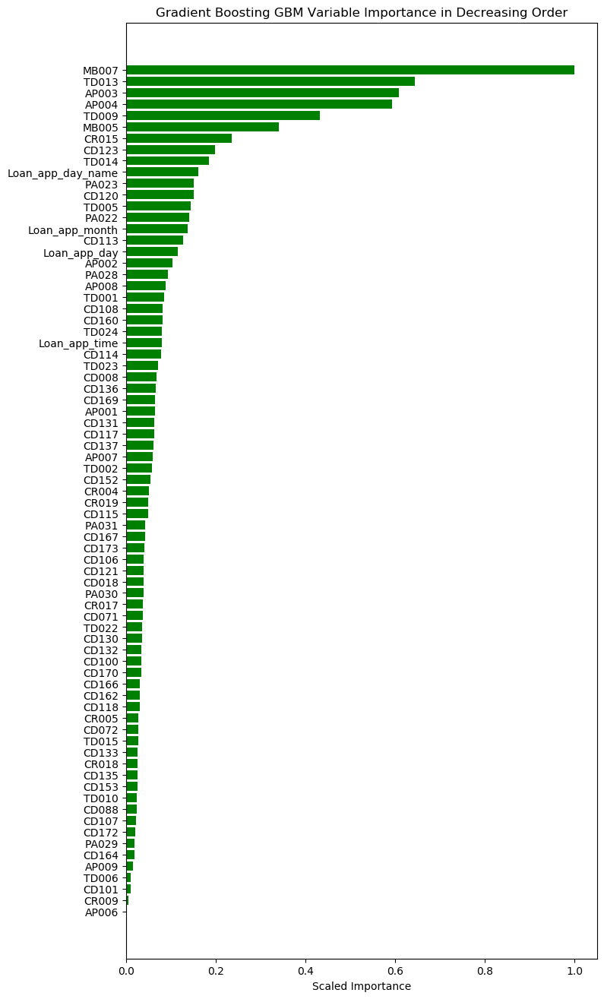

In [62]:
VarImp(gbm_v1, 'Gradient Boosting GBM')

#### There are also other plots, which might give a better explanation of the model. However, all models, do not support all graphs. 

These are just for illustrative purpose:

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

- Heatmap
![Heatmap](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_varimp_heatmap_wine.png)

- Correlation Map
![Correlation](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_model_correlation_heatmap_wine.png)

- SHAP Plot
![SHAP Plot](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_shap_summary_wine.png)

- Individual Conditional Expectation (ICE)
![ICE Plot](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_ice_plot_wine_alcohol.png)




### Predict on Test Set

Use the original `test_hex` set for prediction

In [63]:
def actual_predict(model,test_hex,target):
    y_pred = model.predict(test_hex).as_data_frame()
    y_actual = test_hex[target].as_data_frame()
    df_actual_predict = pd.concat([y_actual,y_pred],axis=1)
    df_actual_predict.columns = ['actual','pred']
    return(df_actual_predict)

In [64]:
GBM_actual_predict = actual_predict(gbm_v1,test_hex,target)
GBM_actual_predict.head()

gbm prediction progress: |████████████████████████████████████████████████| 100%


,actual,pred
0,0,0.215147
1,0,0.050372
2,0,0.374611
3,0,0.220820
4,0,0.067337


### ROC and Area Under Curve

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The method was developed for operators of military radar receivers, which is why it is so named.

In [65]:
dd = GBM_actual_predict
GBM_roc_auc_value = roc_auc_score(dd['actual'],dd['pred'])
GBM_roc_auc_value

0.6913812680867455

### Gain Table

In [66]:
def gains_table(df_actual_predict):
    df_actual_predict = df_actual_predict.sort_values(by='pred',ascending=False)
    df_actual_predict['row_id'] = range(0,0+len(df_actual_predict))
    
    df_actual_predict['decile'] = (df_actual_predict['row_id'] / (len(df_actual_predict)/10)).astype(int)
    df_actual_predict.loc[df_actual_predict['decile'] == 10] =9
    
    # Create gains table
    gains = df_actual_predict.groupby('decile')['actual'].agg(['count','sum'])
    gains.columns = ['count','actual']
    gains

    gains['non_actual'] = gains['count'] - gains['actual']
    gains['cum_count'] = gains['count'].cumsum()
    gains['cum_actual'] = gains['actual'].cumsum()
    gains['cum_non_actual'] = gains['non_actual'].cumsum()
    gains['percent_cum_actual'] = (gains['cum_actual'] / np.max(gains['cum_actual'])).round(2)
    gains['percent_cum_non_actual'] = (gains['cum_non_actual'] / np.max(gains['cum_non_actual'])).round(2)
    gains['if_random'] = np.max(gains['cum_actual']) /10
    gains['if_random'] = gains['if_random'].cumsum()
    gains['lift'] = (gains['cum_actual'] / gains['if_random']).round(2)
    gains['K_S'] = np.abs( gains['percent_cum_actual'] - gains['percent_cum_non_actual']  ) * 100 
    gains['gain'] = (gains['cum_actual'] / gains['cum_count']*100).round(2)
    return(gains)

In [67]:
GBM_gains = gains_table(GBM_actual_predict)
GBM_gains

,count,actual,non_actual,cum_count,cum_actual,cum_non_actual,percent_cum_actual,percent_cum_non_actual,if_random,lift,K_S,gain
decile,,,,,,,,,,,,
0,6000,2450,3550,6000,2450,3550,0.21,0.07,1164.1,2.10,14.0,40.83
1,6000,1868,4132,12000,4318,7682,0.37,0.16,2328.2,1.85,21.0,35.98
2,6000,1566,4434,18000,5884,12116,0.51,0.25,3492.3,1.68,26.0,32.69
3,6000,1347,4653,24000,7231,16769,0.62,0.35,4656.4,1.55,27.0,30.13
4,6000,1165,4835,30000,8396,21604,0.72,0.45,5820.5,1.44,27.0,27.99
5,6000,1003,4997,36000,9399,26601,0.81,0.55,6984.6,1.35,26.0,26.11
6,6000,817,5183,42000,10216,31784,0.88,0.66,8148.7,1.25,22.0,24.32
7,6000,648,5352,48000,10864,37136,0.93,0.77,9312.8,1.17,16.0,22.63
8,6000,516,5484,54000,11380,42620,0.98,0.88,10476.9,1.09,10.0,21.07


#### The Lift score I oroginally obtained while tuning the parameters differently was 2.31, but I lost track of the exact parameters used for that score. Hence, here I will be describing the parameters which gave me the Lift score of 2.10 only. 

### ROC with Precision Recall

In [68]:
def ROC_PR(df_actual_predict):
    
    print('')
    print('   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate')
    print('')
    print('   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy')
    print('')
    print('   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)')
    print('')
    
    #  ROC
    roc_auc_value = roc_auc_score(df_actual_predict['actual'],df_actual_predict['pred'])
    fpr, tpr, _ = roc_curve(df_actual_predict['actual'],df_actual_predict['pred'])
    roc_auc = auc(fpr,tpr)
    
    lw=2
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.plot(fpr,tpr, color='darkorange',lw=lw,label='AUC = %0.4f)' %roc_auc_value)
    plt.plot([0,1],[0,1], color='navy',lw=lw,linestyle='--')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve: AUC={0:0.4f}'.format(roc_auc_value))
    plt.legend(loc='lower right')
    
    # Precision-Recall
    plt.subplot(1,2,2)
    average_precision = average_precision_score(df_actual_predict['actual'],df_actual_predict['pred'])
    precision, recall, _ = precision_recall_curve(df_actual_predict['actual'],df_actual_predict['pred'])
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall,precision,step='post',alpha=0.2,color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0,1.05])
    plt.ylim([0.0,1.05])
    plt.title('Precision-Recall curve: PR={0:0.4f}'.format(average_precision))


   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate

   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy

   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)



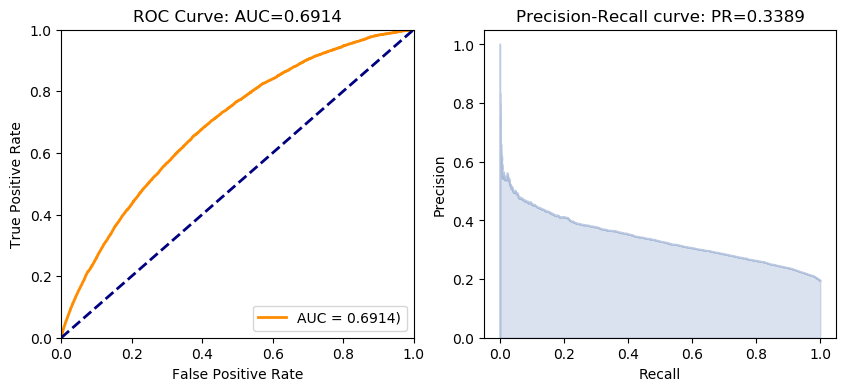

In [69]:
ROC_PR(GBM_actual_predict)

### Observations:

I see that in the  GBM models, the result is satisfactory.

In our dataset, the minority class represents 19.3% or around 1/5th of the total data, and the majority class represents  81.7% or 4/5th of the total data, or around 4 times the minority class. The underlying assumption for the stable results is that this dataset is not a bad distribution of class, and 20% data in a one class is fine for building a stable model. If we had more than 5-6 times of the minority class data in the majority class, then that would be be settled well by the `balance_class` parameter in the model.

I also observed that for thisregression problem, balance classes parameter did not make any difference.

Also, for the train test split, I found that a split of 75:25 works best for all my models. I tried other combination, but a 75% train gives me the best Lift score of 2.08 in both the models. So, I will continue with the same split ratio further.

The optimum hyper-parameters for the GBM model built above are:
- ntrees = 350
- nfolds = 10
- min-rows = 100
- max_depth = 5
- learn_rate = 0.02
- stopping_rounds = 0 

Please see below for the meaningful business insights:

### Business Insight:

H2O package is a very effective and efficient package to build a machine learning model for predicting loan default. Also, H2O package is very handy to display the variable importance, handle correlations, and also dummy code the categorical variables. 

Gains table and Lift:
For the final model I built after tuning all the models on various different values of each parameter and finally tuning all the hyper-parameters for the best result, the highest `Lift` score I obtaned is 2.10, which is good as per industry standards. A Lift score of above 2 is suitable for the model to be of acceptable standards.

ROC and AUC:
The area under the ROC curve (AUC) assesses overall classification performance. But, AUC does not place more emphasis on one class over the other, so it does not reflect the minority class well. The Precision-Recall (PR) curves will be more informative than ROC when dealing with highly skewed datasets. The PR curves plot precision vs. recall (FPR). Because Precision is directly influenced by class imbalance so the Precision-recall curves are better to highlight differences between models for highly imbalanced data sets. 

However, both of them do not accurately represent the results, as one doesnt reflect the minority class well, and the other is sensitive to imbalanced data. Hence, we use the H2O package, which takes care of all these problems for us. We get an AUC of 0.69 and PR of 0.34, which is acceptable, but I will try to improve them further in my following models.

The major outcome of this excercise is that GBM is a good model to predict loan default, as per the given data. However, we should not undermine other good boosting models such as xgboost, or Auto-ML and others. These might provide better results as well. 

## 4.2. Deep Learning (DL) Model <a class="anchor" id="Section_42"></a>

In [70]:
from h2o.estimators.deeplearning import H2ODeepLearningEstimator

### Define the target and predictor variables

In [71]:
# Selecting all predictor variables

predictors = ['AP001', 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       'AP008', 'AP009', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR009', 'CR015', 'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005',
       'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       'Loan_app_day']

target = 'loan_default'

In [72]:
len(predictors)

75

In [73]:
len(df.columns.to_list())

76

### Train the DL Model

In [74]:
DL_modl1 = H2ODeepLearningEstimator(
    model_id = 'DL_modl1',
    distribution = "tweedie",
    activation = "RectifierWithDropout",
    hidden=[75, 60, 30, 10, 30, 60, 75],
    input_dropout_ratio = 0.2,
    sparse=True,
    l1=1e-5,
    epochs=200,
    overwrite_with_best_model = True,
    stopping_rounds = 0,
    balance_classes = False)

DL_modl1.train(
    x=predictors,
    y=target,
    training_frame=train_hex,
    validation_frame=test_hex)

deeplearning Model Build progress: |██████████████████████████████████████| 100%


### Check Variable Importance

I tried Feature selection based on variable  importance, but it degrades the model performance. So, I will use all the features.

In [75]:
var_imps = pd.DataFrame(DL_modl1.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])
print()
print("The 10 most important features are: ")
print()
var_imps.head(10)


The 10 most important features are: 



,Variable,Relative_Importance,Scaled_Importance,Percentage
0,AP003,1.000000,1.000000,0.017488
1,MB005,0.628325,0.628325,0.010988
2,TD013,0.596745,0.596745,0.010436
3,TD014,0.588603,0.588603,0.010293
4,Loan_app_month.April,0.559939,0.559939,0.009792
5,CD113,0.555401,0.555401,0.009713
6,Loan_app_month.July,0.525340,0.525340,0.009187
7,AP006.android,0.520526,0.520526,0.009103
8,CD114,0.515060,0.515060,0.009007
9,TD009,0.514604,0.514604,0.008999


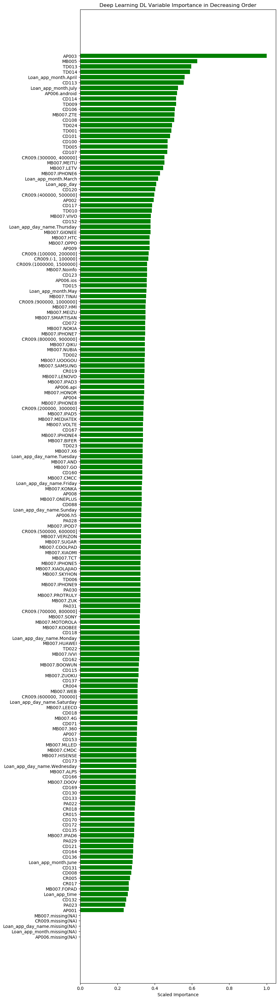

In [76]:
def VarImp(model_name,m_name):
    
    # plot the variable importance
    plt.rcdefaults()
    variables = model_name._model_json['output']['variable_importances']['variable']
    y_pos = np.arange(len(variables))
    fig, ax = plt.subplots(figsize = (8,40))
    scaled_importance = model_name._model_json['output']['variable_importances']['scaled_importance']
    ax.barh(y_pos,scaled_importance,align='center',color='green')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(variables)
    ax.invert_yaxis()
    ax.set_xlabel('Scaled Importance')
    ax.set_title(m_name + ' Variable Importance in Decreasing Order')
    plt.show()

VarImp(DL_modl1, 'Deep Learning DL')

### Predict on Test Set

Use the original `test_hex` set for prediction

In [77]:
DL_actual_predict = actual_predict(DL_modl1,test_hex,target)
DL_actual_predict.head()

deeplearning prediction progress: |███████████████████████████████████████| 100%


,actual,pred
0,0,0.231750
1,0,0.220237
2,0,0.281408
3,0,0.235533
4,0,0.235691


### ROC and Area Under Curve

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The method was developed for operators of military radar receivers, which is why it is so named.

In [78]:
dd = DL_actual_predict
DL_roc_auc_value = roc_auc_score(dd['actual'],dd['pred'])
DL_roc_auc_value

0.6623823746755865

### Gain Table

In [79]:
DL_gains = gains_table(DL_actual_predict)
DL_gains

,count,actual,non_actual,cum_count,cum_actual,cum_non_actual,percent_cum_actual,percent_cum_non_actual,if_random,lift,K_S,gain
decile,,,,,,,,,,,,
0,6000,2186,3814,6000,2186,3814,0.19,0.08,1164.1,1.88,11.0,36.43
1,6000,1790,4210,12000,3976,8024,0.34,0.17,2328.2,1.71,17.0,33.13
2,6000,1518,4482,18000,5494,12506,0.47,0.26,3492.3,1.57,21.0,30.52
3,6000,1335,4665,24000,6829,17171,0.59,0.36,4656.4,1.47,23.0,28.45
4,6000,1186,4814,30000,8015,21985,0.69,0.45,5820.5,1.38,24.0,26.72
5,6000,1049,4951,36000,9064,26936,0.78,0.56,6984.6,1.30,22.0,25.18
6,6000,892,5108,42000,9956,32044,0.86,0.66,8148.7,1.22,20.0,23.70
7,6000,716,5284,48000,10672,37328,0.92,0.77,9312.8,1.15,15.0,22.23
8,6000,573,5427,54000,11245,42755,0.97,0.88,10476.9,1.07,9.0,20.82


### ROC with Precision Recall


   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate

   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy

   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)



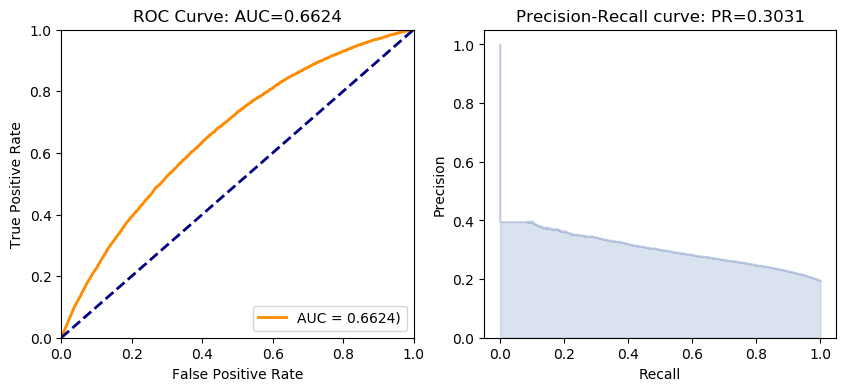

In [80]:
ROC_PR(DL_actual_predict)

### Observations:

I see that in the Deep Learning model, the result is satisfactory.

In our dataset, the minority class represents 19.3% or around 1/5th of the total data, and the majority class represents  81.7% or 4/5th of the total data, or around 4 times the minority class. The underlying assumption for the stable results is that this dataset is not a bad distribution of class, and 20% data in a one class is fine for building a stable model. If we had more than 5-6 times of the minority class data in the majority class, then that would be be settled by balancing the classes.

Also, for the train test split, I found that a split of 75:25 works best for all my models. I tried other combination, but a 75% train gives me the best Lift score of 2.11 in both the models. So, I will continue with the same split ratio further.

The optimum hyper-parameters for the GBM model built above are:
- hidden = [75, 60, 30, 10, 30, 60, 75],
- input_dropout_ratio = 0.2,
- sparse=True,
- l1=1e-5,
- epochs=200,
- overwrite_with_best_model = True,
- stopping_rounds = 0,
- balance_classes = False

#### Deep Learning regression does not accept True as a value for 'balance_classes'. 

Please see below for the meaningful business insights:

### Business Insight:

H2O package is a very effective and efficient package to build a machine learning model for predicting loan default. Also, H2O package is very handy to display the variable importance, handle correlations, and also dummy code the categorical variables. 

Gains table and Lift:
For the final model I built after tuning all the models on various different values of each parameter and finally tuning all the hyper-parameters for the best result, the highest `Lift` score I obtaned is 1.9, which is good as per industry standards. A Lift score of around 2 is suitable for the model to be of acceptable standards.

ROC and AUC:
The area under the ROC curve (AUC) assesses overall classification performance. But, AUC does not place more emphasis on one class over the other, so it does not reflect the minority class well. The Precision-Recall (PR) curves will be more informative than ROC when dealing with highly skewed datasets. The PR curves plot precision vs. recall (FPR). Because Precision is directly influenced by class imbalance so the Precision-recall curves are better to highlight differences between models for highly imbalanced data sets. 

However, both of them do not accurately represent the results, as one doesnt reflect the minority class well, and the other is sensitive to imbalanced data. Hence, we use the H2O package, which takes care of all these problems for us. We get an AUC of 0.66 and PR of 0.30, which is acceptable, but I will try to improve them further in my following models.

The major outcome of this excercise is that Deep Learning is a good model to predict loan default, as per the given data. However, we should not undermine other good boosting models such as xgboost, or Auto-ML and others. These might provide better results as well. 

### Conclusion:

As per my model building analysis, I saw that h2o Random Forest (through Over Sampling) gave me the best `Lift Score of 3.01`, as was seen in the  previous week's submission.

For this week, out of Gradient Boosting and Deep Learning models, after fine tuning all parameters, I find that GBM gives a better result, and the highest `Lift Score is 2.10`, from the GBM model. 

So I suggest using either Random Forest or  GBM for predicting Loan Defaults. However, other models such as xgboost, and Auto ML might also be explored. 